## Plots on curriculums for the Dynamic Foraging White Paper

Han Hou 02/2025

In [1]:
%load_ext autoreload
%autoreload 2
%matplotlib inline

In [3]:
from aind_analysis_arch_result_access.han_pipeline import get_session_table
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

## Get the master session table

In [4]:
df = get_session_table()
len(df)

8353

## Session count grouped by curriculum over time

In [5]:
df_curriculum = df[['subject_id', 'session_date', 'session', 'curriculum_name', 'curriculum_version', 'current_stage_actual']]

In [6]:
def plot_session_counts_over_time(
    df,
    time_bin="D",
    bar_width=0.8,
    group_by="curriculum_name",
    group_rename=None,
    group_custom_order=None,
    group_custom_color=None,
    ax=None,
):
    """Plot the number of sessions over time, grouped by a specified column.

    Parameters
    ----------
    df : pd.DataFrame
        DataFrame containing the session data. Must contain 'session_date' and the column specified by group_by.
    time_bin : str, optional
        Resampling frequency for the x-axis. See pandas resample for options, by default "D"
    bar_width : float, optional
        Width of the bars in the bar chart, by default 0.8
    group_by : str, optional
        Column name to group by. Must be present in the DataFrame, by default "curriculum_name"
    group_rename : _type_, optional
        rename the groups of the unique values of the group_by column, by default None
    group_custom_order : _type_, optional
        custom order of the groups of the unique values of the group_by column, by default None
    group_custom_color : _type_, optional
        custom color of the groups of the unique values of the group_by column, by default None
    ax : _type_, optional
        _description_, by default None

    Returns
    -------
    _type_
        _description_
    """
    # Count number of sessions per day per type
    session_counts = (
        df.groupby([pd.Grouper(key="session_date", freq=time_bin), group_by])
        .size()
        .unstack(fill_value=0)
    )
    if group_rename is not None:
        session_counts = session_counts.rename(columns=group_rename)
    if group_custom_order is not None:
        session_counts = session_counts[group_custom_order]

    # Plot stacked bar chart
    if ax is None:
        fig, ax = plt.subplots(figsize=(12, 6))
    session_counts.plot(
        kind="bar",
        stacked=True,
        ax=ax,
        width=bar_width,
        **({} if group_custom_color is None else {"color": group_custom_color}),
    )
    ax.set_xlabel("Date")
    ax.set_ylabel("Number of sessions")
    ax.legend(title=group_by)

    # Format x-axis to show only year and month
    ax.set_xticks([])  # Hide all default x-ticks
    ax.set_xticks(
        range(len(session_counts),0, -max(1, len(session_counts) // 10))
    )  # Set sparse ticks
    ax.set_xticklabels(
        session_counts.index[:: -max(1, len(session_counts) // 10)].strftime("%Y-%m"),
        rotation=45,
    )
    ax.spines["top"].set_visible(False)
    ax.spines["right"].set_visible(False)

    # Rotate x axix ticks
    ax.tick_params(axis="x", rotation=45)
    return ax

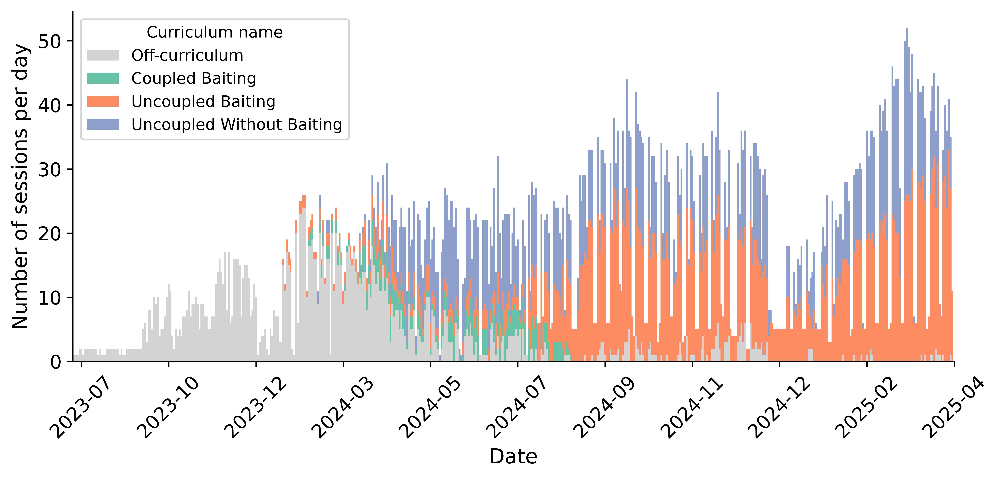

In [10]:
import matplotlib
import matplotlib.colors as mcolors
plt.rcParams.update({'font.size': 12})

# Get colors from the "Set2" colormap
colormap = matplotlib.colormaps["Set2"]

# Display the plot
fig, ax = plt.subplots(figsize=(10, 4), dpi=800)
ax = plot_session_counts_over_time(
    df_curriculum,
    time_bin="D",
    bar_width=1,
    group_rename={
        "Coupled Baiting": "Coupled Baiting",
        "Uncoupled Baiting": "Uncoupled Baiting",
        "Uncoupled Without Baiting": "Uncoupled Without Baiting",
        "None": "Off-curriculum",
    },
    group_custom_order=["Off-curriculum", "Coupled Baiting", "Uncoupled Baiting", "Uncoupled Without Baiting"],
    group_custom_color=["lightgray"] + [colormap(i) for i in range(3)],
    ax=ax,
)

# set axis title font size
ax.set_xlabel("Date", fontsize=13)
ax.set_ylabel("Number of sessions per day", fontsize=13)

# set legend title font size
ax.legend(title="Curriculum name", title_fontsize=10, fontsize=10)

# save svg
fig.savefig("session_counts_by_curriculum_name_over_time.svg", bbox_inches="tight")


## Autotrain trajectory and distribution

In [11]:
df_curriculum_on_only = df_curriculum.query('curriculum_name != "None" and curriculum_version != "0.1"').copy()
len(df_curriculum_on_only)

6324

In [12]:
# Manually group curriculum versions (ver < 2.0, 2.0 <= ver < 2.3, ver >=2.3)
def _map_curriculum_ver(ver):
    if "2.3" in ver:
        return "v3"
    elif "1.0" in ver:
        return "v1"
    else:
        return "v2"

df_curriculum_on_only["curriculum_version_group"] = df_curriculum_on_only["curriculum_version"].map(_map_curriculum_ver)

In [13]:
if_graduated_only = False

if if_graduated_only:
    df_curriculum_on_only = df_curriculum_on_only.groupby("subject_id").filter(lambda x: "GRADUATED" in x["current_stage_actual"].values)

In [9]:
len(df_curriculum_on_only.subject_id.unique())

290

### Stage progression trajectory

In [14]:
stage_order = [
    "STAGE_1_WARMUP",
    "STAGE_1",
    "STAGE_2",
    "STAGE_3",
    "STAGE_4",
    "STAGE_FINAL",
    "GRADUATED",
]

def get_stage_color_mapper(stage_list):
    # Mapping stages to colors from red to green, return rgb values
    # Interpolate between red and green using the number of stages
    cmap = matplotlib.colormaps['RdYlGn']
    stage_color_mapper = {
        stage: matplotlib.colors.rgb2hex(
            cmap(i / (len(stage_list) - 1))) 
        for i, stage in enumerate(stage_list)
    }
    stage_color_mapper.update({"STAGE_3": "#ecedab"})  # Better contrast
    return stage_color_mapper

stage_color_mapper = get_stage_color_mapper(stage_order)

In [15]:
def plot_stage_progression(
    df,
    subject_ids_highlight=[],
    color="black",
    if_highlight_graduated=True,
    min_dropout_session=25,
    ax=None,
):
    """Plot the stage progression of each mouse over time.
        Parameters
        ----------
        df : pd.DataFrame
            DataFrame containing the session data. Must contain 'session_date', 'session', and 'current_stage_y'.
        subject_ids_highlight : list, optional
            List of subject IDs to highlight, by default []
        color : str, optional
            Color for the lines, by default "black"
        if_highlight_graduated : bool, optional
            If True, highlight the first graduated stage of each mouse using green, and the 
            last session of mice who failed to graduated within min_dropout_session using red 
            (dropped out), by default True
        min_dropout_session : int, optional
            Minimum number of sessions to consider a mouse as dropped out, by default 25
        ax : matplotlib.axes.Axes, optional
            Axes
    """
    
    if ax is None:
        fig, ax = plt.subplots(figsize=(5, 2), dpi=500)

    all_mice = df["subject_id"].unique()

    # put highlight mice at the last
    subject_ids = [
        subject_id for subject_id in all_mice if subject_id not in subject_ids_highlight
    ] + subject_ids_highlight
    
    h_dropped_out, h_graduated = None, None

    for subject_id in subject_ids:
        subject_df = df.query("subject_id == @subject_id")
        subject_df = subject_df.sort_values(by="session_date")

        x = subject_df["session"] + np.random.normal(0, 0.1, len(subject_df))
        y = subject_df["current_stage_y"] + np.random.normal(0, 0.1, len(subject_df))

        # add a random small jitter
        ax.plot(
            x,
            y,
            label=subject_id,
            alpha=0.5 if subject_id not in subject_ids_highlight else 1,
            color=color if subject_id not in subject_ids_highlight else "red",
            linewidth=0.2 if subject_id not in subject_ids_highlight else 1,
        )

        # If if highlight_graduated is True, highlight the first graduated stage of each mouse using green,
        # and the last session of mice who failed to graduated using red (dropped out)
        if if_highlight_graduated:
            graduated_sessions = subject_df.query("current_stage_actual == 'GRADUATED'").session
            if graduated_sessions.size > 0:
                first_graduated_idx = graduated_sessions.idxmin()
                h_graduated = ax.scatter(
                    x[first_graduated_idx],
                    y[first_graduated_idx],
                    color="green",
                    marker="o",
                    s=30,
                    alpha=0.7,
                    label="First graduated session"
                )
            elif len(subject_df) > min_dropout_session:
                h_dropped_out = ax.scatter(
                    x.iloc[-1],
                    y.iloc[-1],
                    color="red",
                    marker="x",
                    s=30,
                    alpha=0.7,
                    label=f"Failed to graduate\nafter {min_dropout_session} sessions",
                )

    ax.set(
        xlabel="Session",
        yticks=range(len(df.current_stage_actual.unique())),
        yticklabels=[stage for stage in stage_order if stage in df.current_stage_actual.unique()],
        ylim=(-0.5, 6.5),
    )
    return ax, h_dropped_out, h_graduated

In [21]:
curriculum_name_order = ["Coupled Baiting", "Uncoupled Without Baiting", "Uncoupled Baiting"]
ver_order = ["v1", "v2", "v3"]

colormap = matplotlib.colormaps["Set2"]

fig, ax = plt.subplots(3, 3, figsize=(27, 15), dpi=500) # , gridspec_kw={'hspace': 0.5, 'wspace': 1})

graduated_str = " , GRADUATED only" if if_graduated_only else ""

for i, curriculum in enumerate(curriculum_name_order):
    for j, ver in enumerate(ver_order):   
        this_ax = ax[i, j]
        df_this = df_curriculum_on_only.query("curriculum_name == @curriculum and curriculum_version_group == @ver").copy()

        # Add current_stage_y for each curriculum
        all_unique_stages = [stage for stage in stage_order if stage in df_this["current_stage_actual"].unique()]
        df_this["current_stage_y"] = df_this["current_stage_actual"].map(lambda x: all_unique_stages.index(x))

        # -- density plot for each curriculum in the background--
        sns.histplot(
            df_this,
            x="session",
            y="current_stage_y",
            color=colormap(i),
            bins=(np.arange(-0.5, df_this["session"].max() + 1, 1), np.arange(-0.5, df_this["current_stage_y"].max() + 1, 1)),
            ax=this_ax,
            stat="density",
            cbar=False,
        )
        
        # -- plot the stage progression for each curriculum --
        _, h_dropped_out, h_graduated = plot_stage_progression(
            df_this,
            subject_ids_highlight=[],
            ax=this_ax,
        )

        this_ax.set(
            xlim=(0, 40),
            ylabel="",
        )
        this_ax.set_title(
            label=f"{curriculum} {ver} ({len(df_this.subject_id.unique())} mice, {len(df_this)} sessions{graduated_str})",
            pad=10,
            fontsize=20
        )
        
        # Add legend
        if i == 1 and j == 1:
            this_ax.legend(
                handles=[h_dropped_out, h_graduated],
                fontsize=8,
                loc="lower right",
            )

sns.despine(offset=10, trim=True)
fig.tight_layout()
plt.show()

### Distributions of first entry and last leave

In [23]:
df_stats = df_curriculum_on_only.groupby(["subject_id", "current_stage_actual"], sort=False)[
    "session"
].agg(
    [
        ("session_spent", "count"),  # Number of sessions spent at this stage
        # First entry to this stage
        ("first_entry", "min"),
        # Last leave from this stage
        ("last_leave", "max"),
    ]
)

df_stats["session_spanned"] = df_stats.last_leave - df_stats.first_entry + 1

df_stats = df_stats.reset_index().sort_values(["subject_id", "last_leave"])

# Merge in curriculum name and version name
df_stats = df_stats.merge(df_curriculum_on_only[["subject_id", "curriculum_name", "curriculum_version_group",
                                                 ]].drop_duplicates(), on="subject_id", how="left")

# Melt first_entry and last_leave
df_stats_melt = df_stats.melt(
    id_vars=[
        "subject_id",
        "current_stage_actual",
        "curriculum_name",
        "curriculum_version_group",
    ],
    value_vars=["first_entry", "last_leave"],
    var_name="type",
    value_name="session",
)

# Remove first entry of STAGE_1_WARMUP and last leave of GRADUATED
df_stats_melt = df_stats_melt.query(
    "not (current_stage_actual == 'STAGE_1_WARMUP' and type == 'first_entry') and not (current_stage_actual == 'GRADUATED' and type == 'last_leave')"
)

In [14]:
df_stats

,subject_id,current_stage_actual,session_spent,first_entry,last_leave,session_spanned,curriculum_name,curriculum_version_group
0,690486,STAGE_3,2,6.0,8.0,3.0,Uncoupled Without Baiting,v1
1,690486,STAGE_FINAL,2,7.0,9.0,3.0,Uncoupled Without Baiting,v1
2,690494,STAGE_1,1,9.0,9.0,1.0,Uncoupled Without Baiting,v1
3,690494,STAGE_2,3,7.0,10.0,4.0,Uncoupled Without Baiting,v1
4,697929,STAGE_2,1,3.0,3.0,1.0,Coupled Baiting,v1
...,...,...,...,...,...,...,...,...
1584,786865,GRADUATED,3,11.0,13.0,3.0,Uncoupled Without Baiting,v3
1585,786866,STAGE_1_WARMUP,1,1.0,1.0,1.0,Uncoupled Baiting,v3
1586,786866,STAGE_2,4,2.0,5.0,4.0,Uncoupled Baiting,v3
1587,786866,STAGE_3,1,6.0,6.0,1.0,Uncoupled Baiting,v3


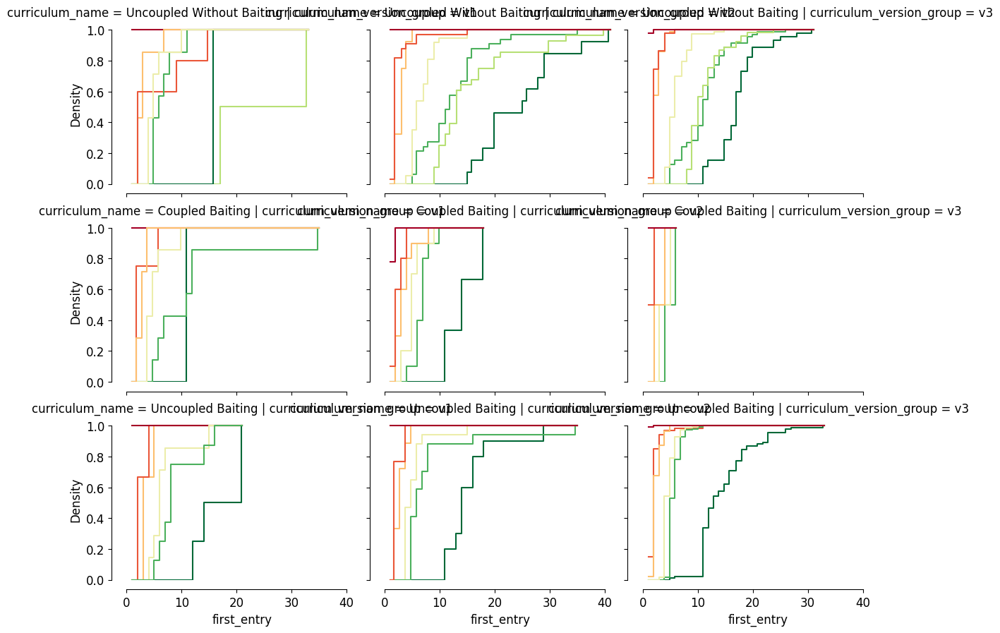

In [24]:
to_plot = "first_entry"

# Set up the FacetGrid for vertical subplots
g = sns.FacetGrid(
    df_stats,
    col="curriculum_version_group",
    row="curriculum_name",
    col_order=ver_order,
    # col_wrap=len(ver_order),
    height=3,
    aspect=1.3,
    sharex=True,
    sharey=True,
    despine=True,
)

# Map the histogram to the FacetGrid
g.map_dataframe(
    sns.histplot,
    x=to_plot,
    hue="current_stage_actual",
    palette=stage_color_mapper,
    element="step",
    fill=False,
    cumulative=True,
    bins=100,
    stat="density",
    common_norm=False,
    legend=True,
)

# for ax in g.axes.flat:
#     ax.set_facecolor('silver')
            
# Adjust layout
sns.despine(offset=10, trim=True)
fig = g.fig
# plt.tight_layout()
plt.show()

In [29]:
df_stats.query("curriculum_version_group == 'v3'  and current_stage_actual == 'GRADUATED'").first_entry.mean()

np.float64(15.65891472868217)

In [31]:
df_stats.query("curriculum_version_group == 'v3'  and current_stage_actual == 'GRADUATED'").first_entry.sem()

np.float64(0.41973138270539984)

### For a certain curriculum group, plot cumulative GRADUATED mice over session

In [17]:
df_curriculum_on_only = df_curriculum.query('curriculum_name != "None" and curriculum_version != "0.1"').copy()

In [18]:
df_curriculum_on_only.curriculum_version.unique()

array(['2.3', '2.3.1rwdDelay159', '2.3rwdDelay159', '2.2.1rwdDelay159',
       '2.2', '1.0', '2.2rwdDelay159', '2.1rwdDelay159', '2.0', '2.1'],
      dtype=object)

In [19]:
# Manually group curriculum versions (ver < 2.0, 2.0 <= ver < 2.3, ver >=2.3)
def _map_curriculum_ver(ver):
    if "2.3" in ver:
        return "v3"
    elif "1.0" in ver:
        return "v1"
    else:
        return "v2"

df_curriculum_on_only["curriculum_version_group"] = df_curriculum_on_only["curriculum_version"].map(_map_curriculum_ver)

In [20]:
df_curriculum_on_only

,subject_id,session_date,session,curriculum_name,curriculum_version,current_stage_actual,curriculum_version_group
0,765062,2025-02-16,7.0,Uncoupled Baiting,2.3,STAGE_FINAL,v3
1,753618,2025-02-16,7.0,Uncoupled Baiting,2.3,STAGE_FINAL,v3
2,770772,2025-02-16,13.0,Uncoupled Baiting,2.3,STAGE_FINAL,v3
3,763704,2025-02-16,14.0,Uncoupled Baiting,2.3,STAGE_FINAL,v3
4,769253,2025-02-16,13.0,Uncoupled Baiting,2.3,STAGE_FINAL,v3
...,...,...,...,...,...,...,...
5810,702200,2024-02-29,4.0,Coupled Baiting,1.0,STAGE_2,v1
5811,697929,2024-02-29,3.0,Coupled Baiting,1.0,STAGE_2,v1
5812,703548,2024-02-29,14.0,Uncoupled Baiting,1.0,STAGE_FINAL,v1
5817,690486,2024-02-28,6.0,Uncoupled Without Baiting,1.0,STAGE_3,v1


In [21]:
# Step 1: Find the first session where each subject graduated
graduation_sessions = df_curriculum_on_only.loc[df_curriculum_on_only["current_stage_actual"] == "GRADUATED", ["subject_id", "session"]]
graduated_subjects = graduation_sessions.groupby("subject_id")["session"].min().to_dict()

df_curriculum_on_only["cumulative_graduated"] = df_curriculum_on_only.apply(
    lambda row: graduated_subjects.get(row["subject_id"], float('inf')) <= row["session"],
    axis=1
)

In [22]:
df_curriculum_on_only

,subject_id,session_date,session,curriculum_name,curriculum_version,current_stage_actual,curriculum_version_group,cumulative_graduated
0,765062,2025-02-16,7.0,Uncoupled Baiting,2.3,STAGE_FINAL,v3,False
1,753618,2025-02-16,7.0,Uncoupled Baiting,2.3,STAGE_FINAL,v3,False
2,770772,2025-02-16,13.0,Uncoupled Baiting,2.3,STAGE_FINAL,v3,False
3,763704,2025-02-16,14.0,Uncoupled Baiting,2.3,STAGE_FINAL,v3,False
4,769253,2025-02-16,13.0,Uncoupled Baiting,2.3,STAGE_FINAL,v3,False
...,...,...,...,...,...,...,...,...
5810,702200,2024-02-29,4.0,Coupled Baiting,1.0,STAGE_2,v1,False
5811,697929,2024-02-29,3.0,Coupled Baiting,1.0,STAGE_2,v1,False
5812,703548,2024-02-29,14.0,Uncoupled Baiting,1.0,STAGE_FINAL,v1,False
5817,690486,2024-02-28,6.0,Uncoupled Without Baiting,1.0,STAGE_3,v1,False


In [23]:
def compute_cumulative_graduation_rate(df):
    # Step 1: Create a DataFrame with the graduation session for each subject
    graduated_subjects = df[df['current_stage_actual'] == 'GRADUATED']
    graduation_df = graduated_subjects.groupby('subject_id')['session'].min().reset_index()
    graduation_df.rename(columns={'session': 'graduation_session'}, inplace=True)

    # Step 2: Merge with all subjects to include curriculum version group and graduation status
    all_subjects = df[['subject_id', 'curriculum_version_group']].drop_duplicates()
    merged = all_subjects.merge(graduation_df, on='subject_id', how='left')

    # Step 3: Compute the proportion graduated for each session in each curriculum version group
    results = []

    for group in merged['curriculum_version_group'].unique():
        group_data = merged[merged['curriculum_version_group'] == group].copy()
        total_subjects = len(group_data)
        
        if total_subjects == 0:
            continue
        
        # Get the maximum session in the original data for this group
        max_session = df[df['curriculum_version_group'] == group]['session'].max()
        if pd.isna(max_session):
            continue
        max_session = int(max_session)
        
        # Iterate through each session from 1 to max_session
        for session in range(1, max_session + 1):
            count = group_data[group_data['graduation_session'] <= session]['subject_id'].count()
            proportion = count / total_subjects
            results.append({
                'curriculum_version_group': group,
                'session': session,
                'proportion_graduated': proportion
            })

    # Create the result DataFrame
    return pd.DataFrame(results)

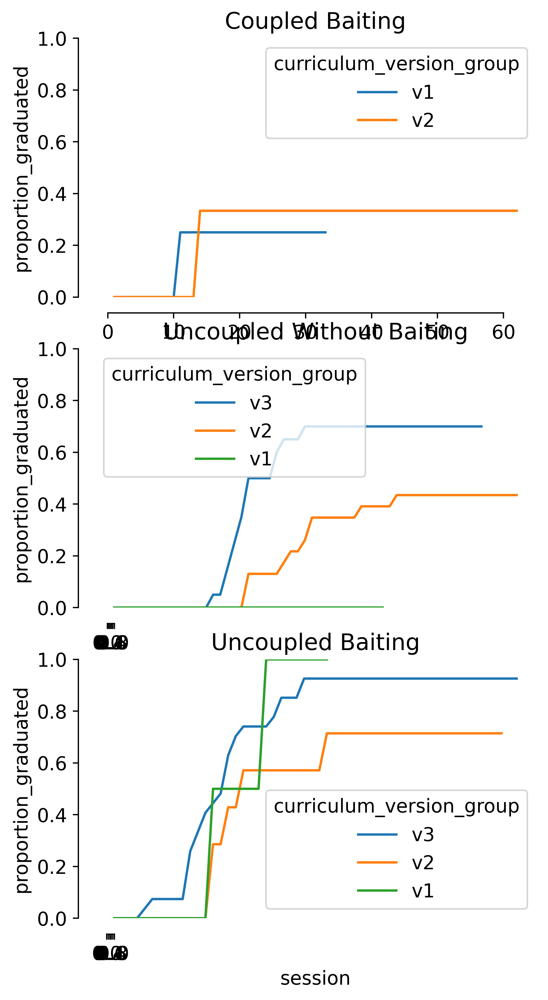

In [49]:
min_dropout_session = 25 # Minimum number of sessions to consider a mouse as dropped out

df_to_plot = df_curriculum_on_only.groupby("subject_id").filter(
        lambda x: x["session"].max() >= min_dropout_session
        )  # Those who have at least 25 sessions

fig, axes = plt.subplots(3, 1, figsize=(5, 10), dpi=500)

for i, curriculum in enumerate(curriculum_name_order):
    df_cumulative_graduation = compute_cumulative_graduation_rate(
        df_to_plot.query("curriculum_name == @curriculum")
    )
    
    ax = axes[i]
    sns.lineplot(
        data=df_cumulative_graduation,
        x="session",
        y="proportion_graduated",
        hue="curriculum_version_group",
        ax=ax,
    )
    ax.set(ylim=(0, 1))
    ax.set_title(curriculum)
    sns.despine(offset=10, trim=True)

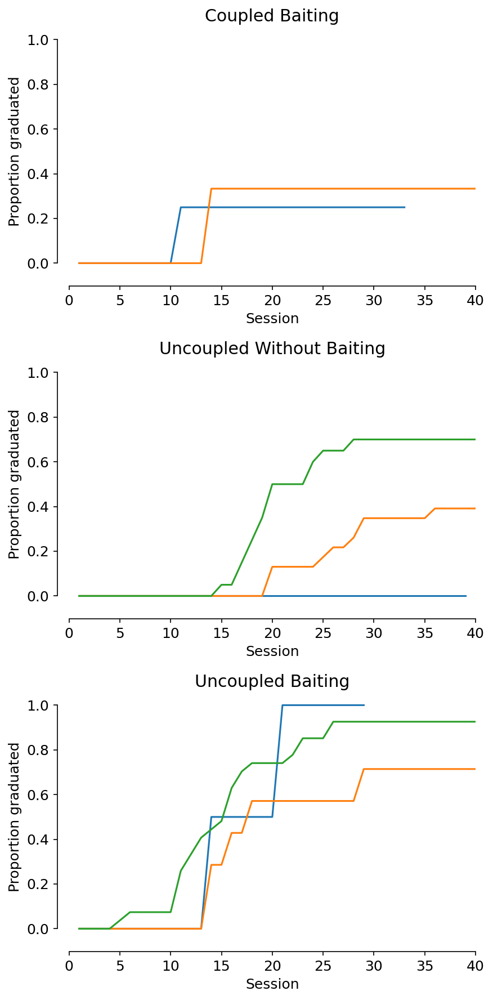

In [50]:
min_dropout_session = 25 # Minimum number of sessions to consider a mouse as dropped out

df_to_plot = df_curriculum_on_only.groupby("subject_id").filter(
        lambda x: x["session"].max() >= min_dropout_session
        )  # Those who have at least 25 sessions

fig, axes = plt.subplots(3, 1, figsize=(6, 12), dpi=150)

for i, curriculum in enumerate(curriculum_name_order):
    ax = axes[i]
    df_cumulative_graduation = compute_cumulative_graduation_rate(
        df_to_plot.query("curriculum_name == @curriculum")
    )
    
    for j, ver in enumerate(ver_order):
        this_df = df_cumulative_graduation.query("curriculum_version_group == @ver")
        if this_df.empty:
            continue
    
        ax.plot(
            this_df["session"],
            this_df["proportion_graduated"],
        )
    ax.set(ylim=(-0.05, 1.05), xlim=(0, 40), ylabel="Proportion graduated", xlabel="Session")
    ax.set_title(curriculum)
    
sns.despine(offset=10, trim=True)
fig.tight_layout()